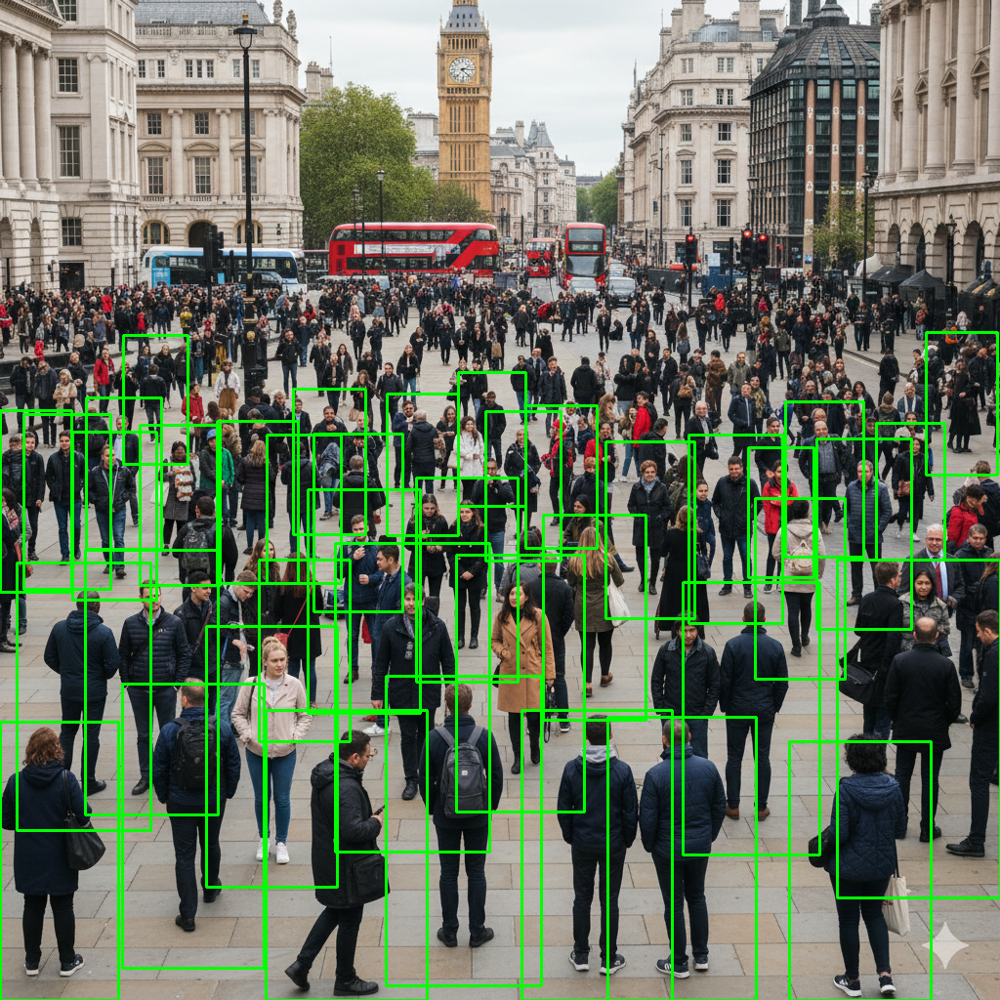

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Load image
image_path = 'img0.png'  # Make sure the file is uploaded in Colab
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Image not found at {image_path}")

# Initialize HOG descriptor/person detector
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# Detect people
boxes, weights = hog.detectMultiScale(
    image,
    winStride=(8, 8),
    padding=(16, 16),
    scale=1.02  # smaller steps for far-away people
)


# Draw bounding boxes
for (x, y, w, h) in boxes:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Display the result in Colab
cv2_imshow(image)


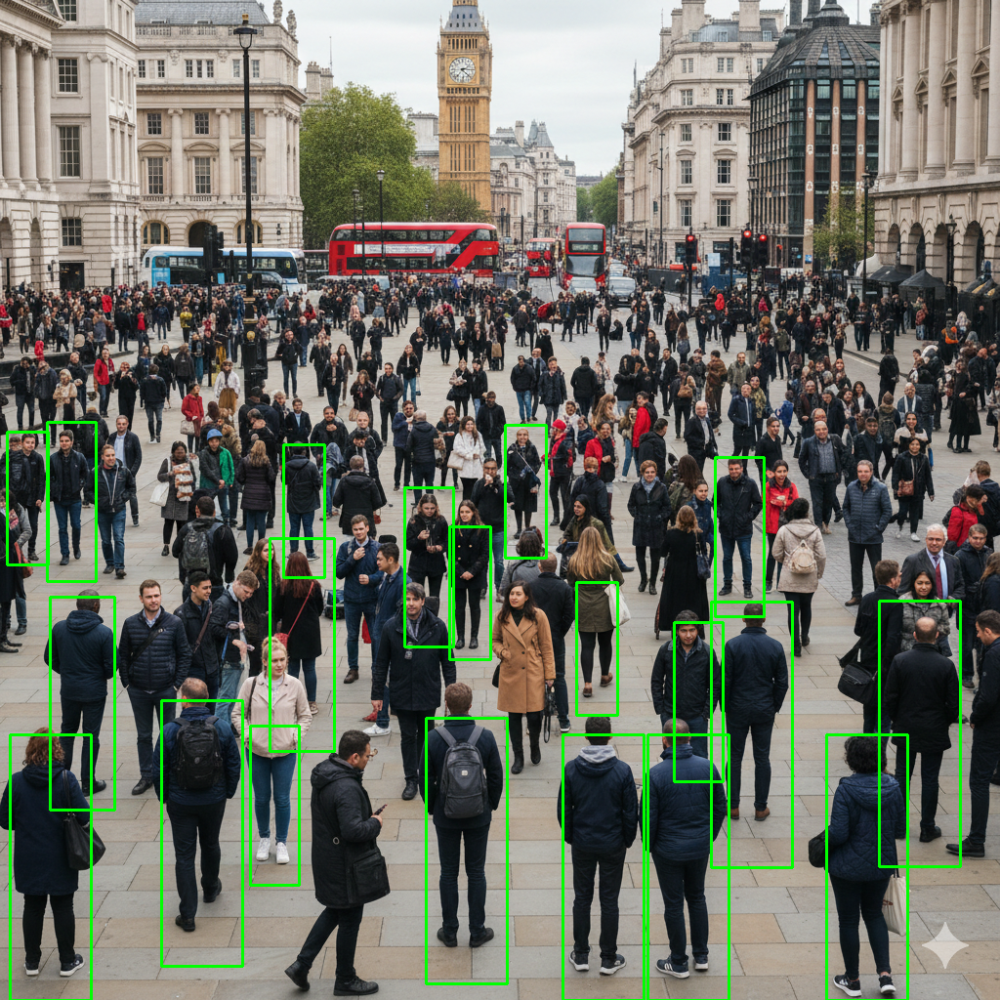

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the scene image
image_path = 'img0.png'  # Replace with your image
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Image not found at {image_path}")

# Load the template image of a person
template = cv2.imread('temp.png', cv2.IMREAD_GRAYSCALE)
if template is None:
    raise ValueError("Template image not found!")

# Convert scene image to grayscale for template matching
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Parameters
threshold = 0.5  # Confidence threshold
scale_factors = [1.0, 0.8, 0.6, 0.5]  # Different scales to detect near/far people
matches = []

# Multi-scale template matching
for scale in scale_factors:
    # Resize template
    t_scaled = cv2.resize(template, None, fx=scale, fy=scale)
    w, h = t_scaled.shape[::-1]

    # Match template
    res = cv2.matchTemplate(gray, t_scaled, cv2.TM_CCOEFF_NORMED)
    loc = np.where(res >= threshold)

    # Save bounding boxes
    for pt in zip(*loc[::-1]):
        matches.append((pt[0], pt[1], w, h))

# Optional: remove overlapping boxes using Non-Max Suppression
def non_max_suppression_fast(boxes, overlapThresh=0.3):
    if len(boxes) == 0:
        return []

    boxes = np.array(boxes)
    pick = []

    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,0] + boxes[:,2]
    y2 = boxes[:,1] + boxes[:,3]

    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(y2)  # sort by bottom-right y-coordinate

    while len(idxs) > 0:
        last = idxs[-1]
        pick.append(last)

        xx1 = np.maximum(x1[last], x1[idxs[:-1]])
        yy1 = np.maximum(y1[last], y1[idxs[:-1]])
        xx2 = np.minimum(x2[last], x2[idxs[:-1]])
        yy2 = np.minimum(y2[last], y2[idxs[:-1]])

        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)

        overlap = (w * h) / area[idxs[:-1]]
        idxs = np.delete(idxs, np.concatenate(([len(idxs)-1],
                                               np.where(overlap > overlapThresh)[0])))

    return boxes[pick].astype("int")

# Apply Non-Max Suppression
boxes = non_max_suppression_fast(matches)

# Draw detected boxes
for (x, y, w, h) in boxes:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Show result
cv2_imshow(image)


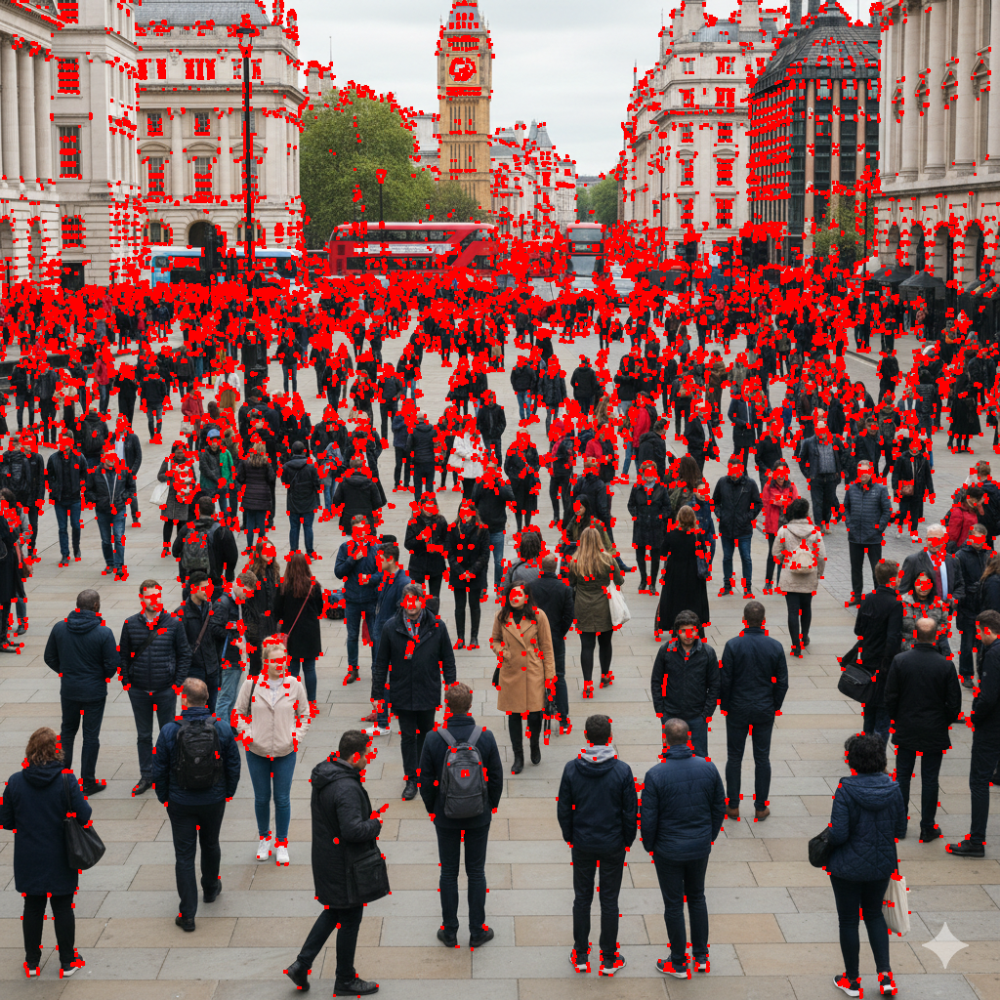

IndexError: index 10 is out of bounds for axis 1 with size 10

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load image
image_path = 'img0.png'
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Image not found at {image_path}")

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Detect Harris corners
gray = np.float32(gray)
dst = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

# Dilate corner points for visualization
dst_dilated = cv2.dilate(dst, None)
image_corners = image.copy()
image_corners[dst_dilated > 0.01 * dst_dilated.max()] = [0, 0, 255]

cv2_imshow(image_corners)

# --- Crowdedness per patch ---
patch_size = 100  # pixels
height, width = gray.shape
crowdedness_map = np.zeros((height // patch_size, width // patch_size))

# Threshold for corner detection
corner_mask = dst > 0.01 * dst.max()

# Count corners per patch
for i in range(0, height, patch_size):
    for j in range(0, width, patch_size):
        patch_corners = corner_mask[i:i+patch_size, j:j+patch_size]
        crowdedness_map[i//patch_size, j//patch_size] = np.sum(patch_corners)

print("Crowdedness map (keypoints per patch):")
print(crowdedness_map)


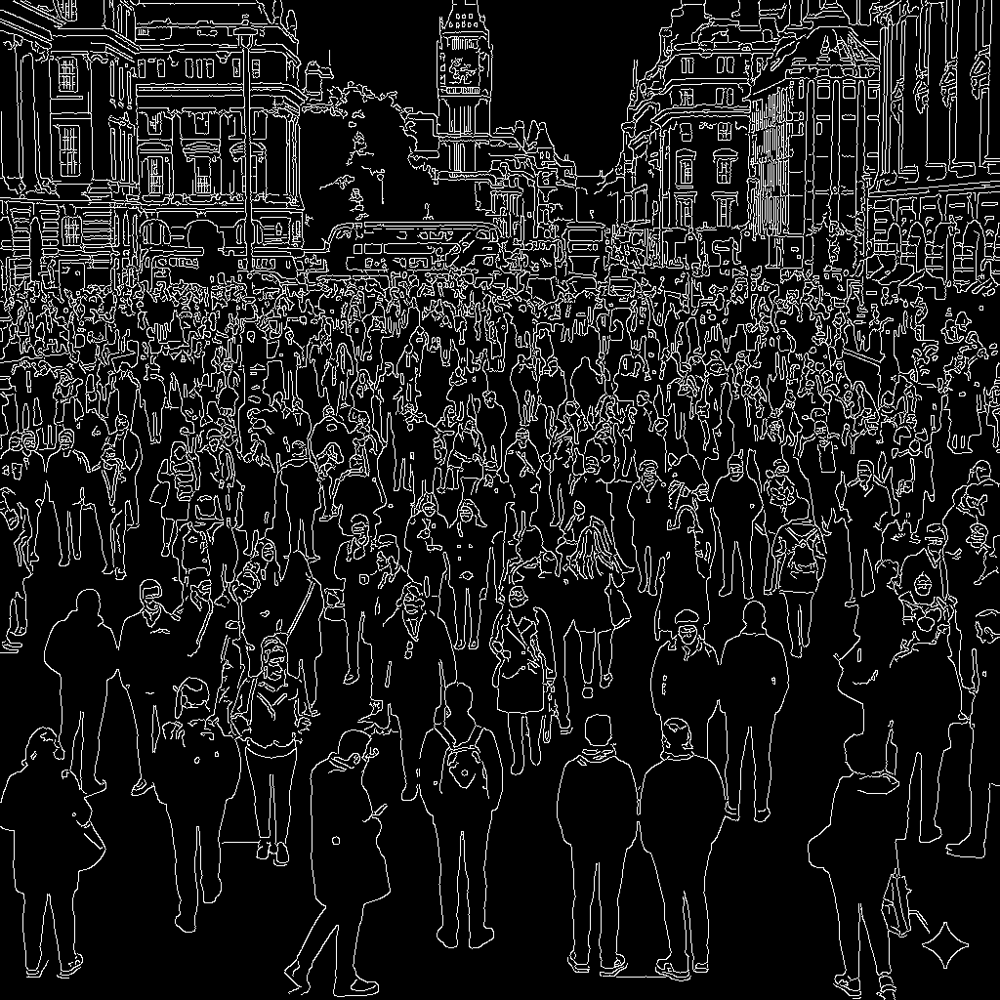

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load image
image_path = 'img0.png'
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Image not found at {image_path}")

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Optional: reduce noise (important!)
blur = cv2.GaussianBlur(gray, (5, 5), 0)

# Canny edge detection
edges = cv2.Canny(
    blur,
    threshold1=50,   # lower threshold
    threshold2=150   # upper threshold
)

# Show result
cv2_imshow(edges)


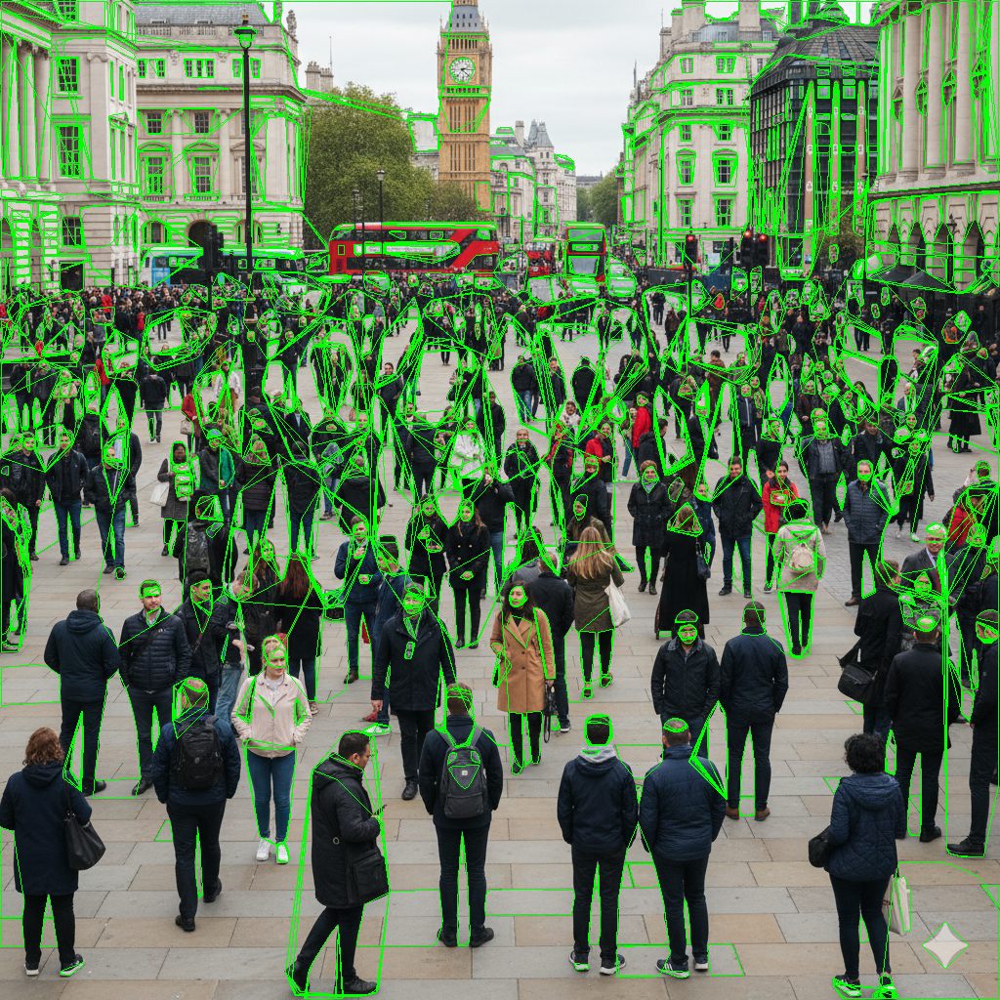

In [ ]:
د ب
